In [1]:
import os
from os.path import join
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
# Creating datasets of jigsaw sets
jigsaw_1 = os.listdir('Dataset/Jigsaw_1')
jigsaw_2 = os.listdir('Dataset/Jigsaw_2')
jigsaw_3 = os.listdir('Dataset/Jigsaw_3')
jigsaw_4 = os.listdir('Dataset/Jigsaw_4')

In [3]:
import cv2
import numpy as np

def transform_colorspace(image):
    # convert to YUV
    YUV = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    # split channels
    _, U, _ = cv2.split(YUV)

    return U

def transform_blur_and_thresh(U, use_morphology=True):
    # Apply blurring to U channel and thresholding [1], [2]
    blur = cv2.GaussianBlur(U, (25, 25), 0)
    _, mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    if use_morphology:
        kernel = np.ones((5, 5), np.uint8)
        mask = cv2.erode(mask, kernel, iterations=2)

        mask = cv2.dilate(mask, kernel, iterations=2)

    return mask

def segment_contours_cropping(mask, image, min_area_ratio=0.005):

    contours, _ = cv2.findContours(mask, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return []

    pieces = []

    # Calculate minimum area threshold
    image_area = mask.shape[0] * mask.shape[1]
    min_area_threshold = image_area * min_area_ratio

    # Loop through contours
    for c in contours:
        # find the area of the contour
        A = cv2.contourArea(c)

        if A < min_area_threshold:
            continue

        # bound the contour with a rectangle
        x, y, w, h = cv2.boundingRect(c)

        padding = 5
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(image.shape[1] - x, w + 2*padding)
        h = min(image.shape[0] - y, h + 2*padding)

        # cropping the image and mask
        cropped_img = image[y:y+h, x:x+w]
        cropped_mask = mask[y:y+h, x:x+w]

        pieces.append((cropped_img, cropped_mask))

    print(f"  Found {len(pieces)} pieces after filtering (min_area: {min_area_threshold:.0f})")

    return pieces


def piece_boundary(cropped_mask):

    # Find contours on the new mask (copped)
    contours, _ = cv2.findContours(cropped_mask, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)
    
    if not contours:
        return None
    
    piece_contour = max(contours, key=cv2.contourArea)
    
    return piece_contour

# def detect_corners(contour):

#     hull = cv2.convexHull(contour)
    
#     perimeter = cv2.arcLength(hull, closed=True)
#     epsilon = 0.05 * perimeter  # Start with 5%, adjust if needed
#     corners = cv2.approxPolyDP(hull, epsilon, closed=True)
    
#     if len(corners) != 4:
#         epsilon = 0.1 * perimeter
#         corners = cv2.approxPolyDP(hull, epsilon, closed=True)
    
#     return corners

def detect_corners(contour):
    x, y, w, h = cv2.boundingRect(contour)
    
    corners_rect = np.array([
        [x, y],           # top-left
        [x + w, y],       # top-right  
        [x + w, y + h],   # bottom-right
        [x, y + h]        # bottom-left
    ])
    
    contour_reshaped = contour.reshape(-1, 2)
    refined_corners = []
    
    # For each bounding box corner, look INWARD for the real corner
    inward_offsets = [
        (20, 20),    # top-left: look down and right
        (-20, 20),   # top-right: look down and left
        (-20, -20),  # bottom-right: look up and left
        (20, -20)    # bottom-left: look up and right
    ]
    
    for corner, offset in zip(corners_rect, inward_offsets):
        # Search region is slightly INWARD from bounding box
        search_center = corner + np.array(offset)
        
        distances = np.linalg.norm(contour_reshaped - search_center, axis=1)
        nearby_indices = np.where(distances < 60)[0]
        
        if len(nearby_indices) < 3:
            closest_idx = np.argmin(distances)
            refined_corners.append(contour_reshaped[closest_idx])
            continue
        
        best_idx = nearby_indices[0]
        best_score = float('inf')
        contour_len = len(contour_reshaped)
        
        for idx in nearby_indices:
            p1 = contour_reshaped[(idx - 15) % contour_len]
            p2 = contour_reshaped[idx]
            p3 = contour_reshaped[(idx + 15) % contour_len]
            
            v1 = p1 - p2
            v2 = p3 - p2
            
            norm_product = np.linalg.norm(v1) * np.linalg.norm(v2)
            if norm_product > 0:
                cos_angle = np.dot(v1, v2) / norm_product
                cos_angle = np.clip(cos_angle, -1, 1)
                angle = np.degrees(np.arccos(cos_angle))
                
                angle_diff = abs(angle - 90)
                distance = np.linalg.norm(contour_reshaped[idx] - search_center)
                
                # Heavily weight the angle (tabs have sharper angles than 90)
                score = (angle_diff * 3) + (distance / 5)
                
                if score < best_score:
                    best_score = score
                    best_idx = idx
        
        refined_corners.append(contour_reshaped[best_idx])
    
    return np.array(refined_corners, dtype=np.int32).reshape(-1, 1, 2)

def segment_sides(contour, corners):
    contour_reshaped = contour.reshape(-1, 2)
    
    corner_indices = []
    for corner in corners.reshape(-1, 2):
        idx = np.where((contour_reshaped == corner).all(axis=1))[0][0]
        corner_indices.append(idx)
    
    corner_indices = sorted(corner_indices)
    
    sides = []
    for i in range(4):
        start_idx = corner_indices[i]
        end_idx = corner_indices[(i + 1) % 4]
        
        if end_idx > start_idx:
            side = contour_reshaped[start_idx:end_idx+1]
        else:
            side = np.vstack([contour_reshaped[start_idx:], contour_reshaped[:end_idx+1]])
        
        sides.append(side)
    
    return sides

def classify_side(side_contour):

    start_point = side_contour[0]
    end_point = side_contour[-1]
    
    straight_distance = np.linalg.norm(end_point - start_point)
    
    contour_length = cv2.arcLength(side_contour.reshape(-1, 1, 2), False)
    
    curve_ratio = contour_length / straight_distance
    
    if curve_ratio < 1.1: 
        return "FLAT"
    else:

        line_vec = end_point - start_point
        
        mid_idx = len(side_contour) // 2
        mid_point = side_contour[mid_idx]
        
        cross = np.cross(line_vec, mid_point - start_point)
        
        if cross > 0:
            return "TAB"
        else:
            return "SLOT"
        
def classify_piece(side_types):

    flat_count = side_types.count('FLAT')
    
    if flat_count == 2:
        return "CORNER"
    elif flat_count == 1:
        return "EDGE"
    elif flat_count == 0:
        return "MIDDLE"
    else:
        return "UNKNOWN"
    


def transform_convert_clean(cropped_img, cropped_mask):
    # convert to YUV
    cropped_img_YUV = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2YUV)
    # split channels
    Y2, U2, V2 = cv2.split(cropped_img_YUV)
    # equalise the histogram
    Y_new = cv2.equalizeHist(Y2)
    # merge new y channel and convert back
    YUV_new = cv2.merge([Y_new, U2, V2])
    I_new = cv2.cvtColor(YUV_new, cv2.COLOR_YUV2BGR)
    # Apply kernel for enhancement
    k = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]], dtype=float)
    I_kernel = cv2.filter2D(I_new, ddepth=-1, kernel=k)
    # extract the ROI, sets bg to black
    piece_only = cv2.bitwise_and(I_kernel, I_kernel, mask=cropped_mask)

    return piece_only



In [4]:
class JigsawPiece:
    def __init__(self, image_path, idx, image, mask, contour, corners, sides, side_types, piece_type):
        self.id = f"{os.path.basename(image_path)}_{idx}"
        self.image = image
        self.mask = mask
        self.contour = contour
        self.corners = corners
        self.sides = sides
        self.side_types = side_types
        self.piece_type = piece_type
        
    def __repr__(self):
        return f"Piece {self.id}: {self.piece_type} {self.side_types}"

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4677.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4677.JPG_0: MIDDLE ['SLOT', 'SLOT', 'SLOT', 'SLOT']


C:\Users\sebas\AppData\Local\Temp\ipykernel_43172\2328413663.py:201: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  cross = np.cross(line_vec, mid_point - start_point)


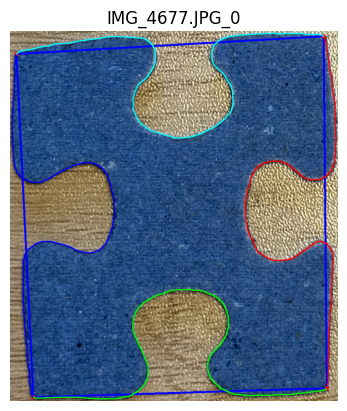

  Stored Piece IMG_4677.JPG_1: EDGE ['SLOT', 'TAB', 'FLAT', 'TAB']


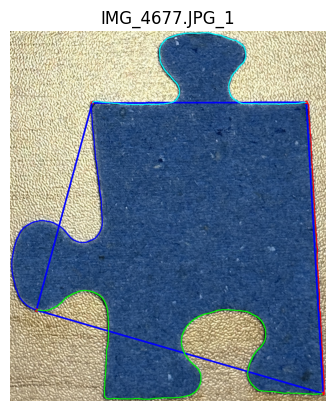

  Stored Piece IMG_4677.JPG_2: EDGE ['SLOT', 'SLOT', 'FLAT', 'SLOT']


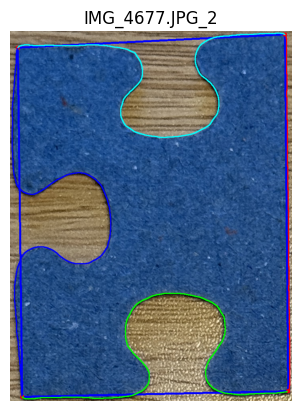

  Stored Piece IMG_4677.JPG_3: MIDDLE ['TAB', 'TAB', 'SLOT', 'SLOT']


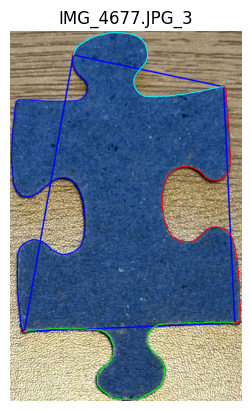

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4678.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4678.JPG_0: MIDDLE ['SLOT', 'TAB', 'SLOT', 'SLOT']


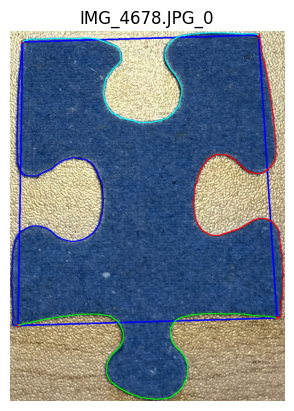

  Stored Piece IMG_4678.JPG_1: MIDDLE ['SLOT', 'SLOT', 'SLOT', 'TAB']


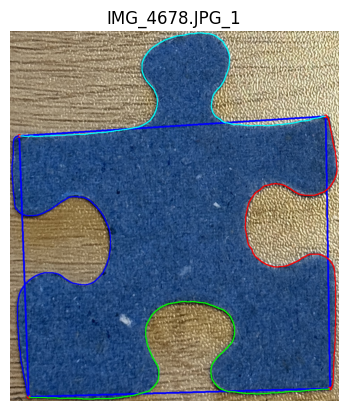

  Stored Piece IMG_4678.JPG_2: MIDDLE ['TAB', 'TAB', 'TAB', 'SLOT']


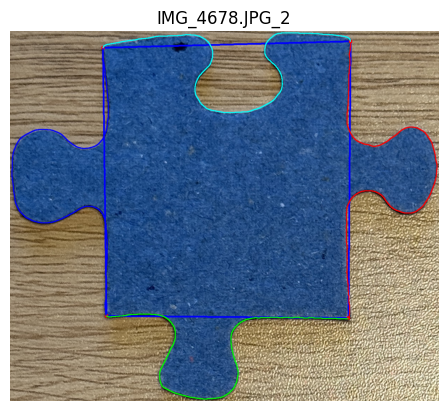

  Stored Piece IMG_4678.JPG_3: MIDDLE ['SLOT', 'TAB', 'TAB', 'SLOT']


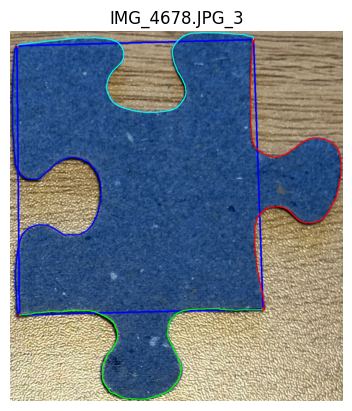

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4679.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4679.JPG_0: MIDDLE ['TAB', 'TAB', 'SLOT', 'SLOT']


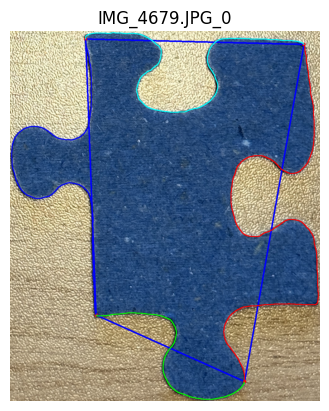

  Stored Piece IMG_4679.JPG_1: MIDDLE ['SLOT', 'TAB', 'SLOT', 'TAB']


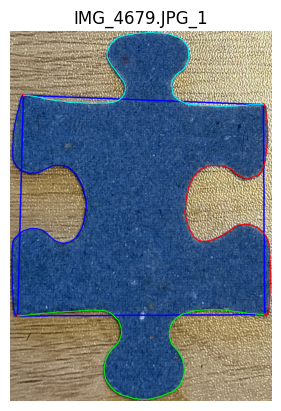

  Stored Piece IMG_4679.JPG_2: MIDDLE ['TAB', 'TAB', 'TAB', 'TAB']


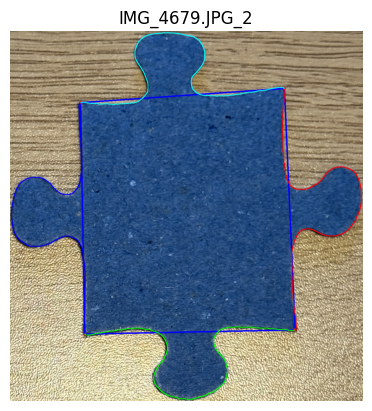

  Stored Piece IMG_4679.JPG_3: MIDDLE ['SLOT', 'TAB', 'SLOT', 'SLOT']


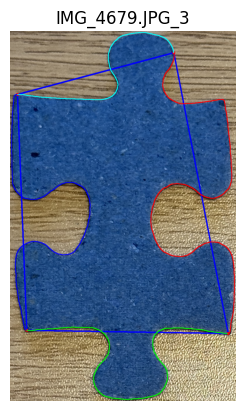

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4680.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4680.JPG_0: EDGE ['SLOT', 'TAB', 'TAB', 'FLAT']


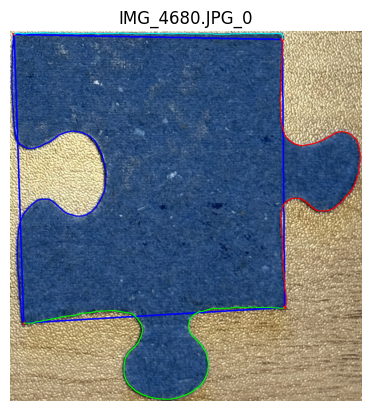

  Stored Piece IMG_4680.JPG_1: MIDDLE ['SLOT', 'SLOT', 'TAB', 'SLOT']


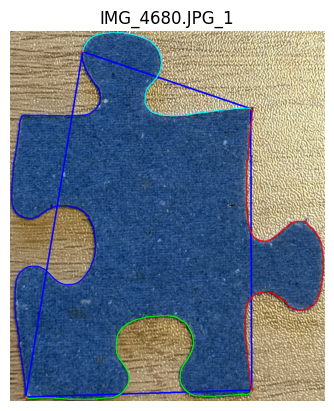

  Stored Piece IMG_4680.JPG_2: MIDDLE ['TAB', 'TAB', 'TAB', 'TAB']


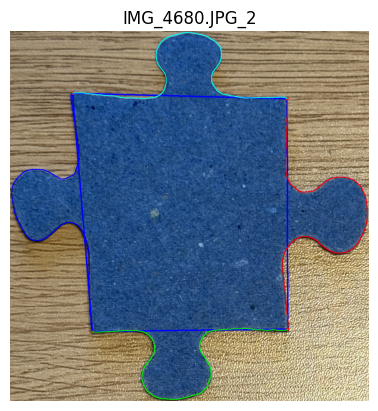

  Stored Piece IMG_4680.JPG_3: MIDDLE ['TAB', 'TAB', 'TAB', 'TAB']


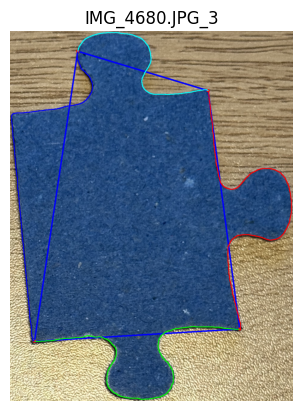

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4681.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4681.JPG_0: EDGE ['SLOT', 'TAB', 'TAB', 'FLAT']


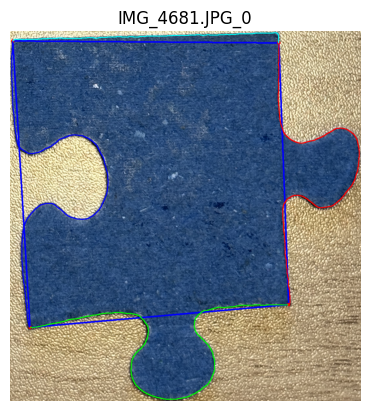

  Stored Piece IMG_4681.JPG_1: MIDDLE ['SLOT', 'SLOT', 'TAB', 'SLOT']


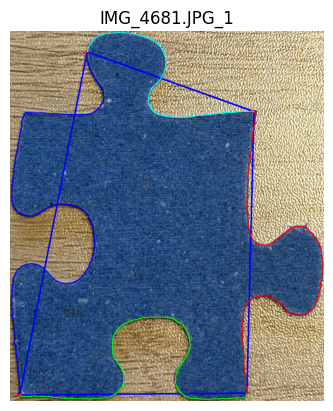

  Stored Piece IMG_4681.JPG_2: MIDDLE ['TAB', 'TAB', 'TAB', 'TAB']


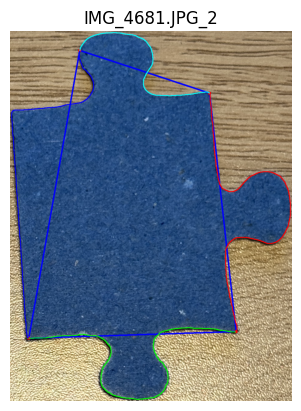

  Stored Piece IMG_4681.JPG_3: MIDDLE ['TAB', 'TAB', 'TAB', 'TAB']


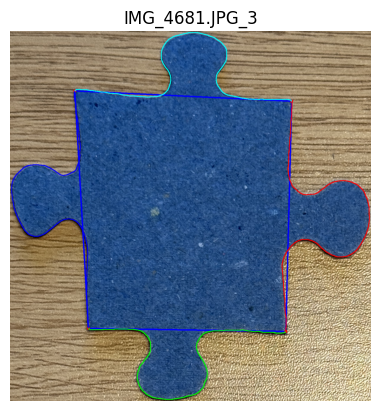

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4682.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4682.JPG_0: MIDDLE ['SLOT', 'SLOT', 'SLOT', 'SLOT']


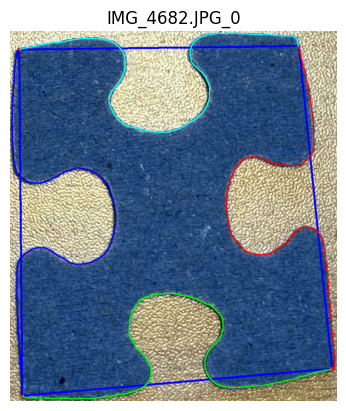

  Stored Piece IMG_4682.JPG_1: EDGE ['TAB', 'FLAT', 'SLOT', 'TAB']


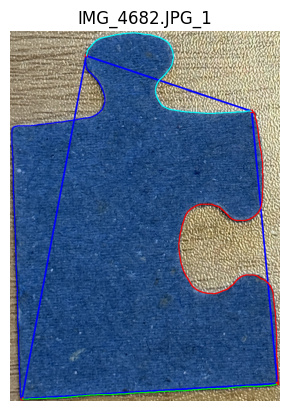

  Stored Piece IMG_4682.JPG_2: MIDDLE ['TAB', 'SLOT', 'TAB', 'SLOT']


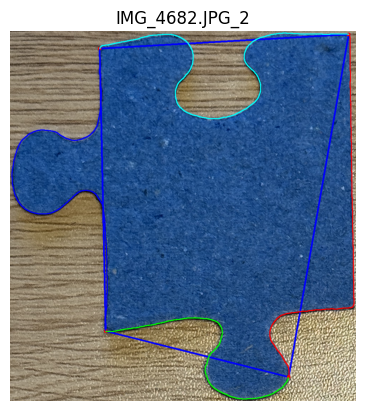

  Stored Piece IMG_4682.JPG_3: MIDDLE ['TAB', 'SLOT', 'TAB', 'TAB']


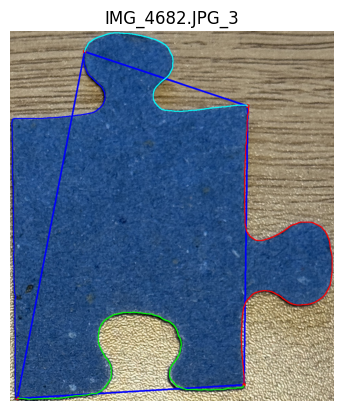

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4683.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4683.JPG_0: EDGE ['FLAT', 'SLOT', 'SLOT', 'SLOT']


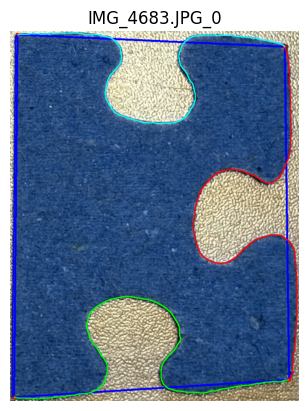

  Stored Piece IMG_4683.JPG_1: MIDDLE ['TAB', 'SLOT', 'TAB', 'TAB']


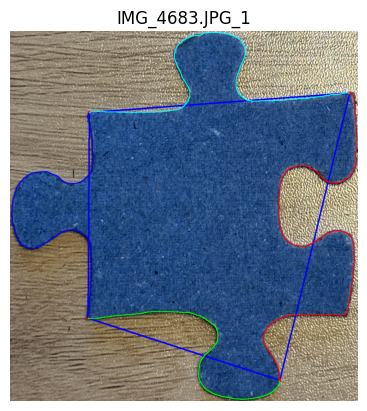

  Stored Piece IMG_4683.JPG_2: MIDDLE ['SLOT', 'TAB', 'SLOT', 'SLOT']


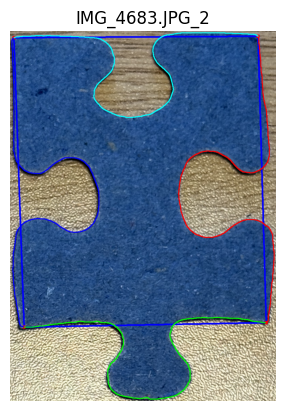

  Stored Piece IMG_4683.JPG_3: MIDDLE ['SLOT', 'TAB', 'SLOT', 'TAB']


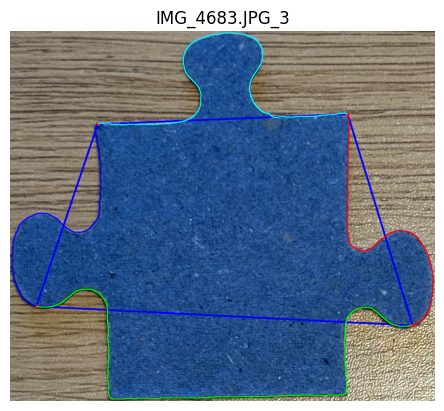

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4684.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4684.JPG_0: MIDDLE ['TAB', 'TAB', 'TAB', 'SLOT']


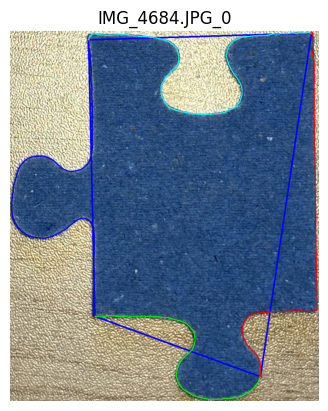

  Stored Piece IMG_4684.JPG_1: EDGE ['FLAT', 'TAB', 'SLOT', 'SLOT']


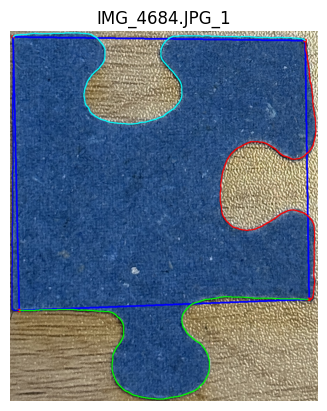

  Stored Piece IMG_4684.JPG_2: MIDDLE ['SLOT', 'SLOT', 'SLOT', 'SLOT']


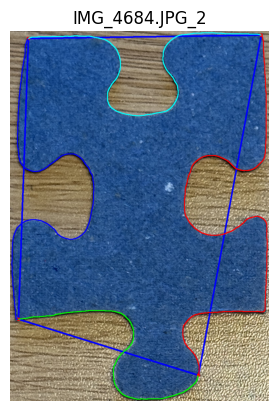

  Stored Piece IMG_4684.JPG_3: MIDDLE ['SLOT', 'SLOT', 'SLOT', 'TAB']


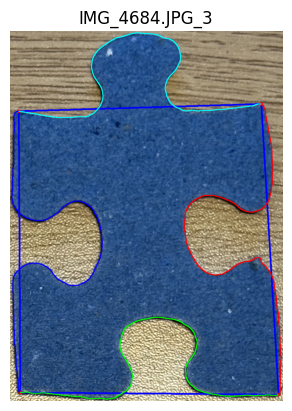

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4685.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4685.JPG_0: EDGE ['SLOT', 'TAB', 'TAB', 'FLAT']


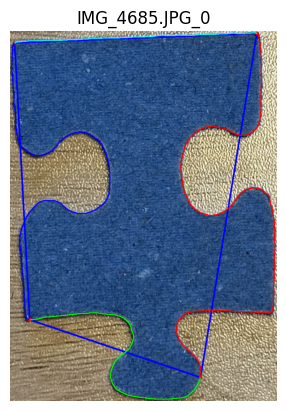

  Stored Piece IMG_4685.JPG_1: EDGE ['SLOT', 'SLOT', 'SLOT', 'FLAT']


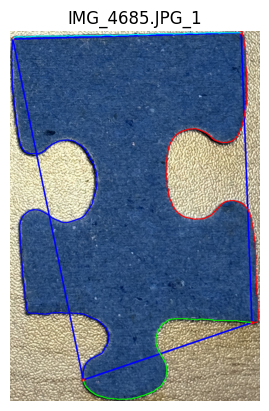

  Stored Piece IMG_4685.JPG_2: MIDDLE ['TAB', 'SLOT', 'SLOT', 'SLOT']


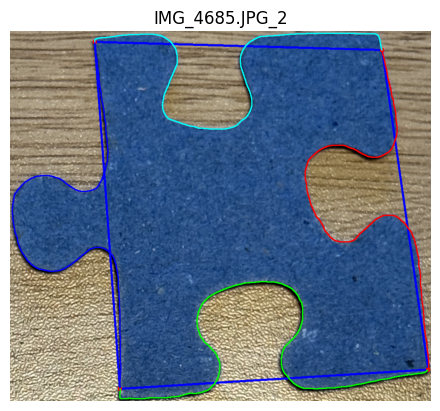

  Stored Piece IMG_4685.JPG_3: EDGE ['SLOT', 'FLAT', 'TAB', 'TAB']


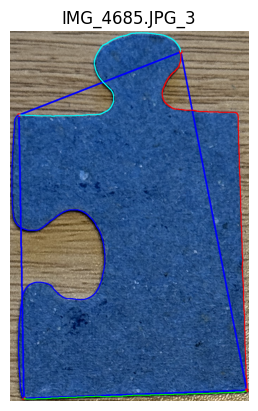

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4686.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4686.JPG_0: MIDDLE ['TAB', 'TAB', 'SLOT', 'TAB']


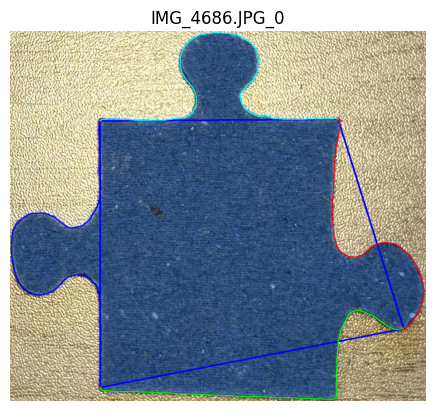

  Stored Piece IMG_4686.JPG_1: MIDDLE ['TAB', 'SLOT', 'SLOT', 'TAB']


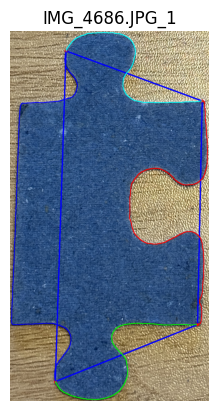

  Stored Piece IMG_4686.JPG_2: EDGE ['TAB', 'SLOT', 'TAB', 'FLAT']


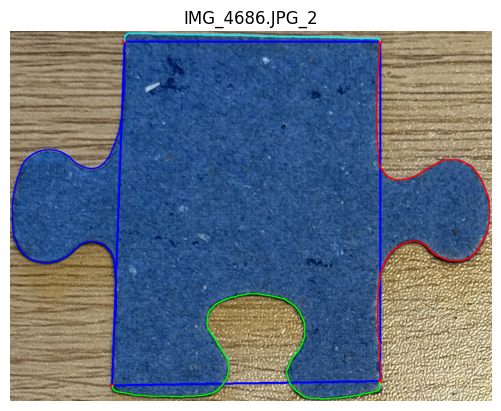

  Stored Piece IMG_4686.JPG_3: EDGE ['SLOT', 'TAB', 'FLAT', 'TAB']


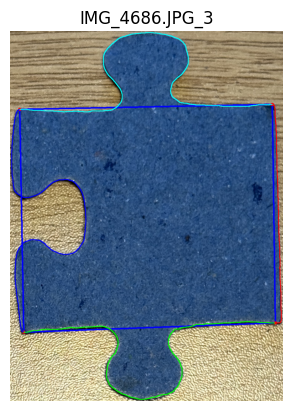

  Found 4 pieces after filtering (min_area: 60964)
Processing: IMG_4687.JPG - Found 4 puzzle pieces
  Stored Piece IMG_4687.JPG_0: CORNER ['SLOT', 'SLOT', 'FLAT', 'FLAT']


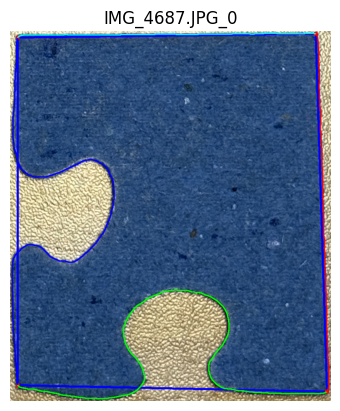

  Stored Piece IMG_4687.JPG_1: CORNER ['SLOT', 'FLAT', 'FLAT', 'SLOT']


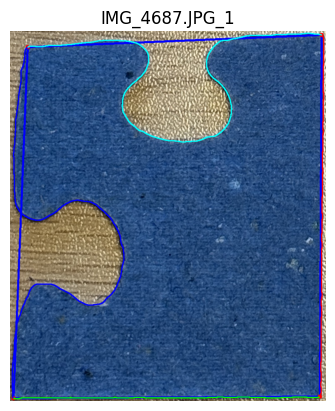

  Stored Piece IMG_4687.JPG_2: MIDDLE ['SLOT', 'TAB', 'SLOT', 'TAB']


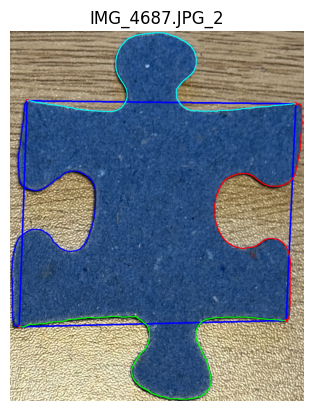

  Stored Piece IMG_4687.JPG_3: EDGE ['TAB', 'TAB', 'FLAT', 'TAB']


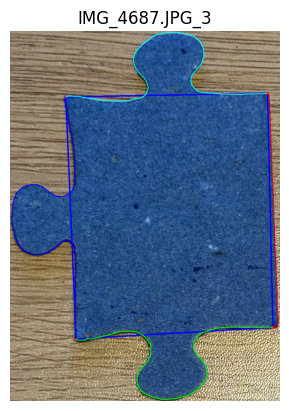

  Found 2 pieces after filtering (min_area: 60964)
Processing: IMG_4688.JPG - Found 2 puzzle pieces
  Stored Piece IMG_4688.JPG_0: EDGE ['FLAT', 'SLOT', 'TAB', 'SLOT']


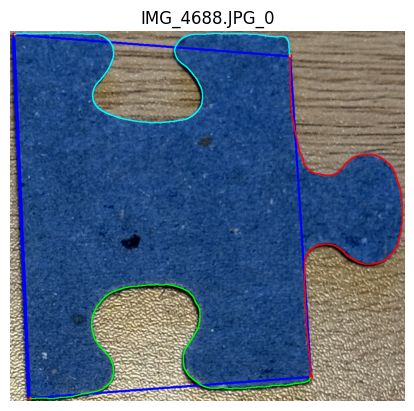

  Stored Piece IMG_4688.JPG_1: MIDDLE ['SLOT', 'TAB', 'TAB', 'SLOT']


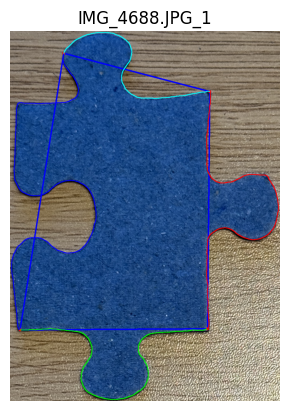


Total pieces stored: 46


In [5]:
all_pieces = []

for piece in jigsaw_2:
    piece_path = os.path.join('Dataset/Jigsaw_2', piece)
    I = cv2.imread(piece_path)
    if I is not None:
        U = transform_colorspace(I)
        mask = transform_blur_and_thresh(U)
        result = segment_contours_cropping(mask, I)
        
        if isinstance(result, tuple) and len(result) == 2:
            if isinstance(result[0], np.ndarray) and isinstance(result[1], np.ndarray):
                pieces = [result]
            else:
                pieces = result
        else:
            pieces = result
        
        print(f"Processing: {piece} - Found {len(pieces)} puzzle pieces")
        
        for idx, (cropped_img, cropped_mask) in enumerate(pieces):
            boundary = piece_boundary(cropped_mask)
            if boundary is not None:
                corners = detect_corners(boundary)
                sides = segment_sides(boundary, corners)
                
                side_types = []
                for side in sides:
                    side_type = classify_side(side)
                    side_types.append(side_type)

                piece_type = classify_piece(side_types)

                # Create and store the JigsawPiece object
                new_piece = JigsawPiece(piece_path, idx, cropped_img, cropped_mask, boundary, corners, sides, side_types, piece_type)
                all_pieces.append(new_piece)

                print(f"  Stored {new_piece}")

                # Visualization
                boundary_piece = cropped_img.copy()

                cv2.drawContours(boundary_piece, [boundary], -1, (0,255,0), 2)

                if corners is not None:
                    cv2.drawContours(boundary_piece, [corners], -1, (255,0,0), 3)
             
                    for corner in corners:
                        x, y = corner[0]
                        cv2.circle(boundary_piece, (x, y), 5, (0,0,255), -1)

                    colors = [(255,0,0), (0,255,0), (0,0,255), (255,255,0)]  # Blue, Green, Red, Yellow
                    for i, side in enumerate(sides):
                        side_reshaped = side.reshape(-1, 1, 2).astype(np.int32)
                        cv2.polylines(boundary_piece, [side_reshaped], False, colors[i], 2)

                plt.imshow(cv2.cvtColor(boundary_piece, cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.title(f"{new_piece.id}")
                plt.show()
    else:
        print(f"Could not read image: {piece_path}")

print(f"\nTotal pieces stored: {len(all_pieces)}")